In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
from PIL import Image, ImageDraw

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

trained_model = load_model('/content/drive/MyDrive/Combination/part3_hrnet.keras')
print("Trained model loaded")

Trained model loaded


In [ ]:
test_images = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/test_images.npy')
test_binary_masks = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/test_binary_masks.npy')

print("Testing data loaded")

Testing data loaded


In [ ]:
predictions_trained = trained_model.predict(test_images)

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 781ms/step


In [ ]:
predictions_trained.shape

(146, 256, 256, 1)

In [ ]:
np.max(predictions_trained)

0.9999995

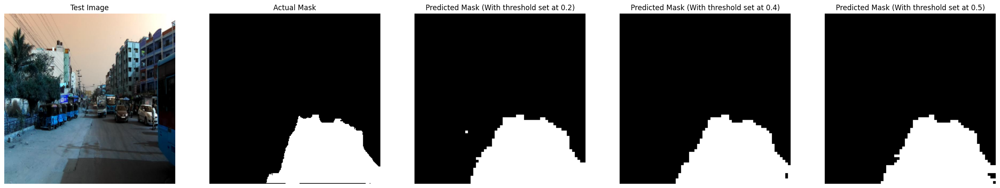

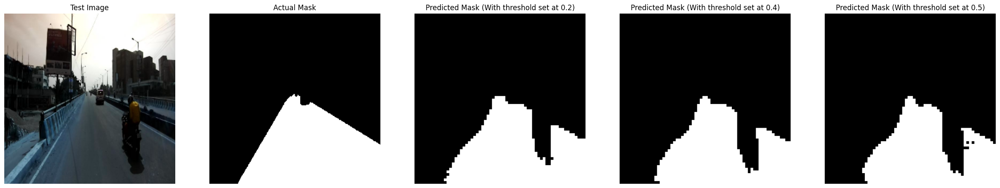

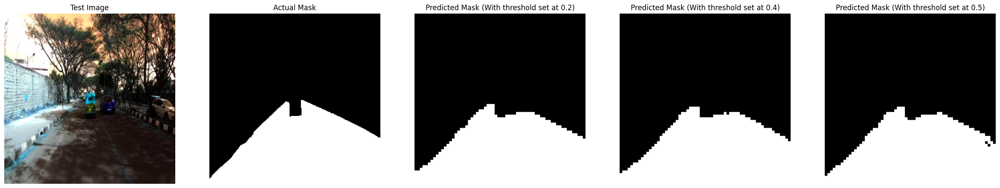

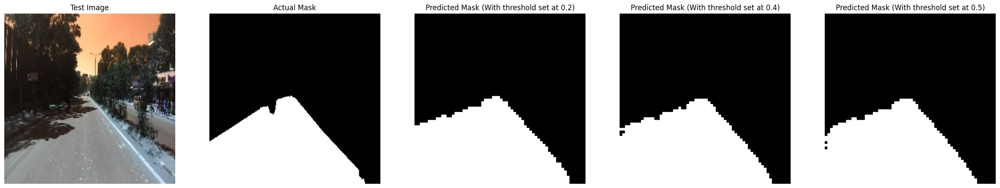

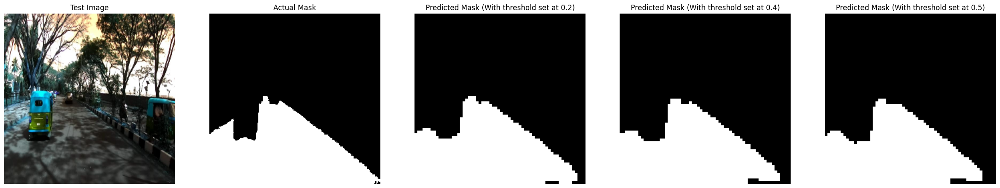

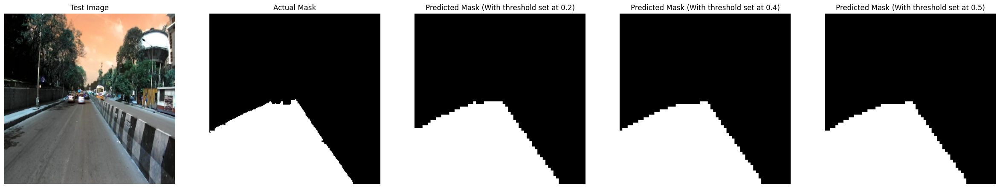

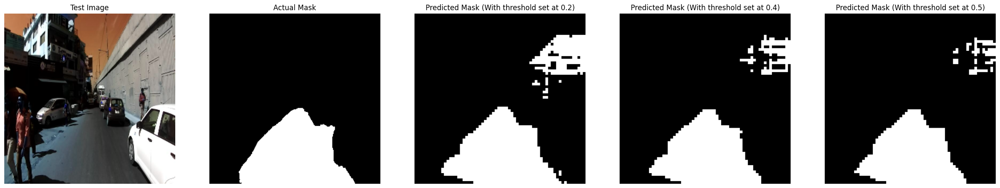

In [ ]:
threshold1 = 0.2
threshold2 = 0.4
threshold3 = 0.5
predictions_trained_threshold1 = (predictions_trained > threshold1).astype(np.uint8)
predictions_trained_threshold2 = (predictions_trained > threshold2).astype(np.uint8)
predictions_trained_threshold3 = (predictions_trained > threshold3).astype(np.uint8)

import matplotlib.pyplot as plt


for index in [6,10,12,14,15,21,24]:

  plt.figure(figsize=(30,24))

  plt.subplot(1, 5, 1)
  plt.imshow(test_images[index])
  plt.title('Test Image')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.imshow(test_binary_masks[index], cmap='gray')
  plt.title('Actual Mask')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.imshow(predictions_trained_threshold1[index], cmap='gray')
  plt.title('Predicted Mask (With threshold set at {})'.format(threshold1))
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.imshow(predictions_trained_threshold2[index], cmap='gray')
  plt.title('Predicted Mask (With threshold set at {})'.format(threshold2))
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.imshow(predictions_trained_threshold3[index], cmap='gray')
  plt.title('Predicted Mask (With threshold set at {})'.format(threshold3))
  plt.axis('off')
  # plt.show()

# plt.title('Predicted Mask (With threshold set at {})'.format(threshold))


<ipython-input-8-2c52f76b1df1>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(17,7))


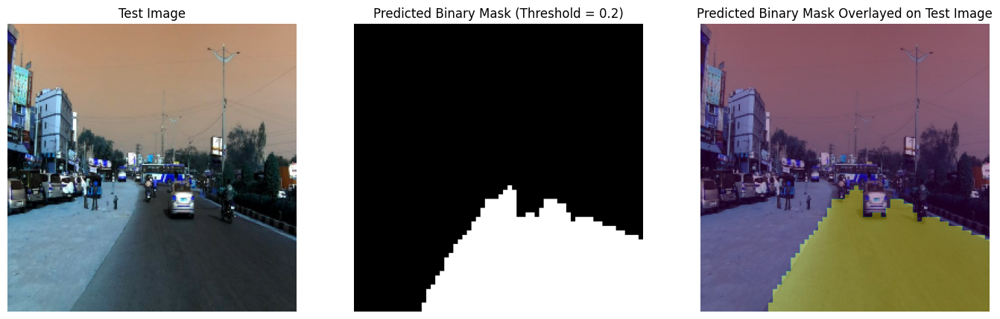

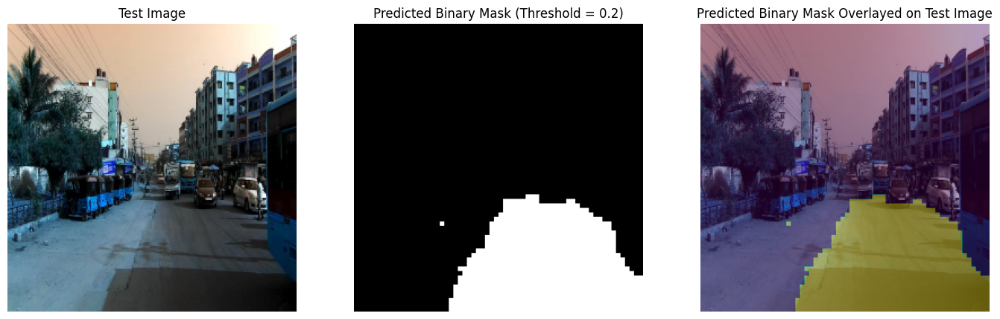

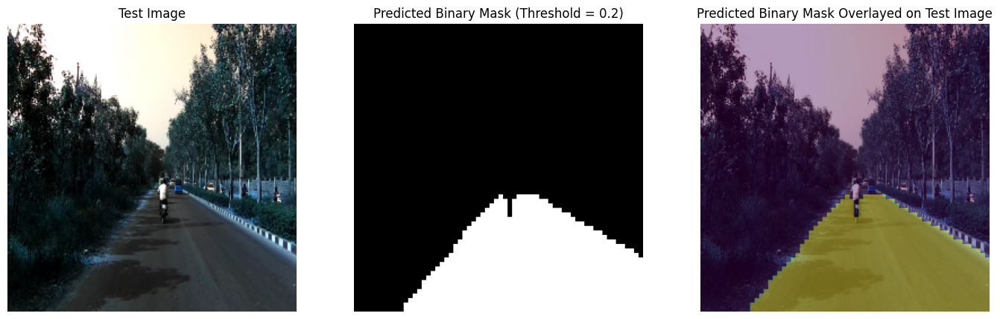

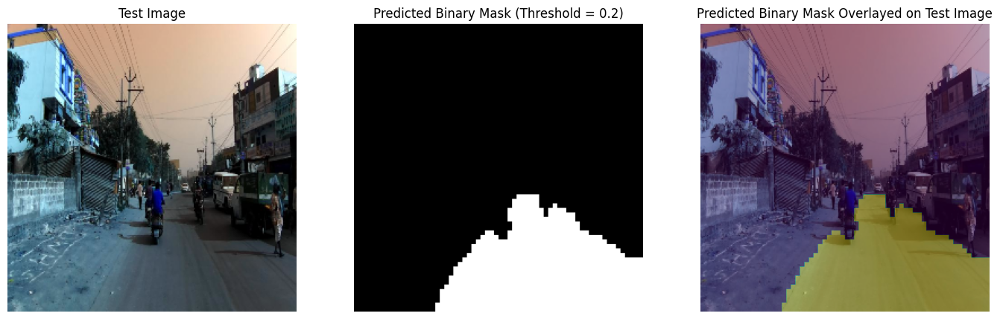

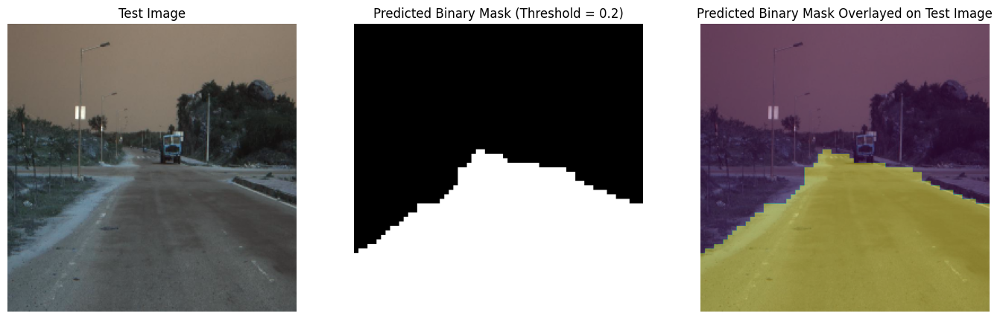

...

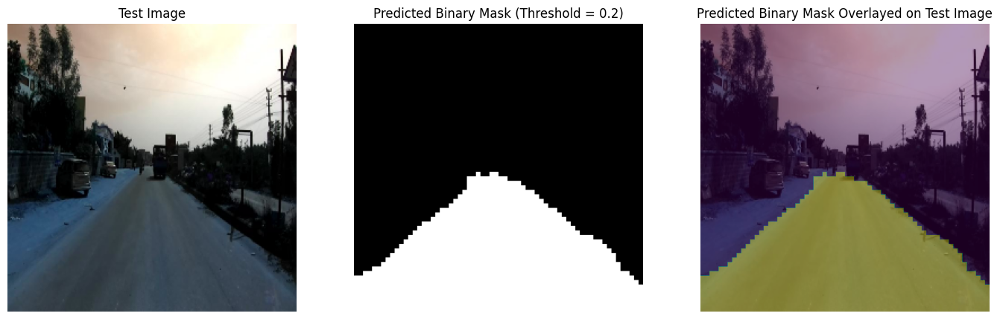

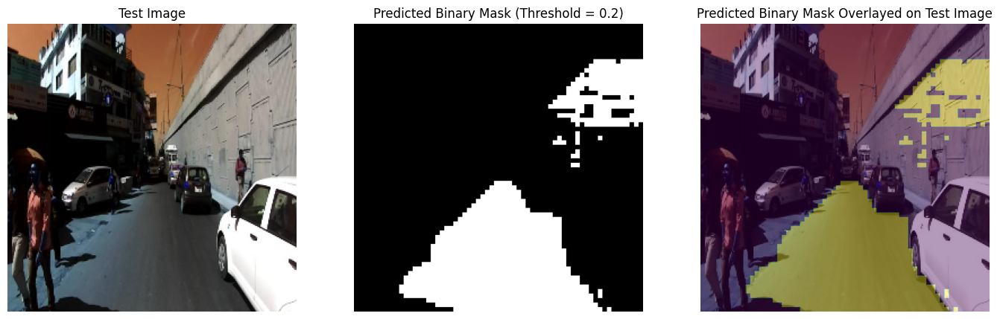

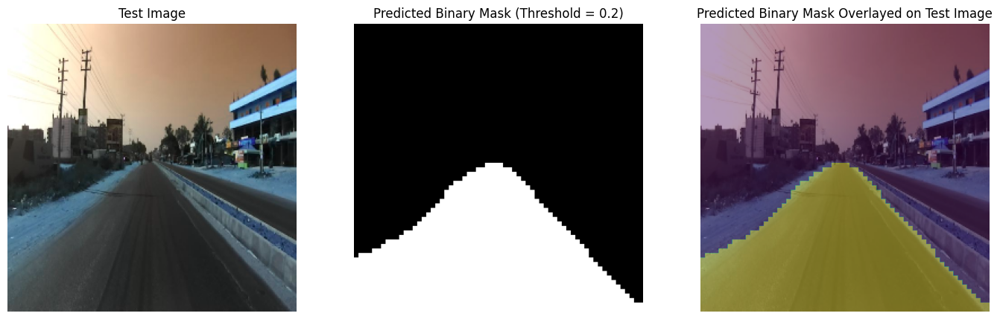

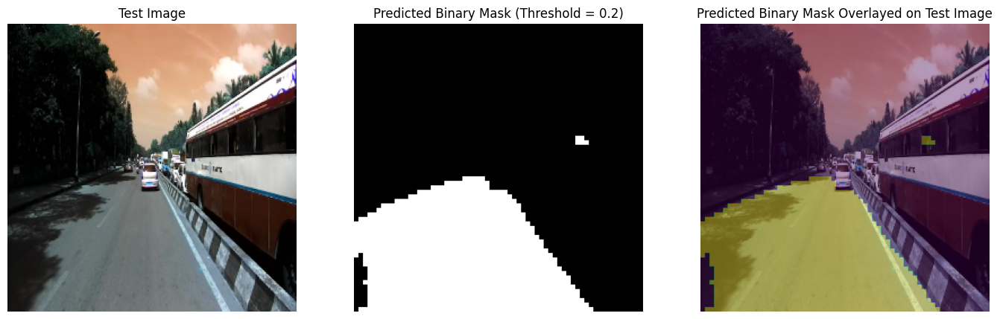

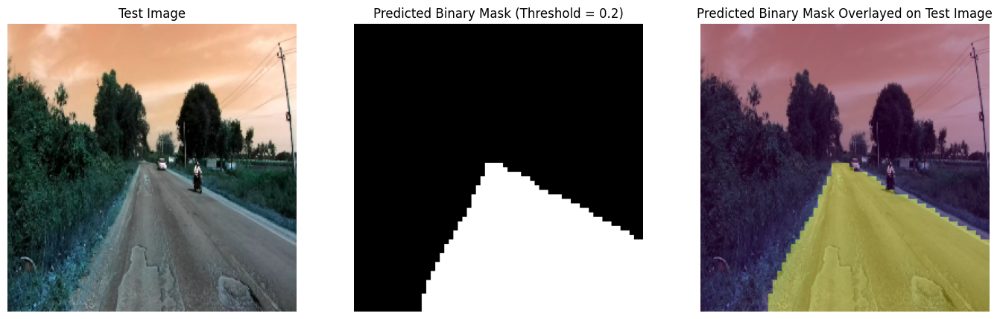

In [ ]:
for index in range(28):
  if index < 5:
    continue
  plt.figure(figsize=(17,7))

  plt.subplot(1, 3, 1)
  plt.imshow(test_images[index])
  plt.title('Test Image')
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.imshow(predictions_trained_threshold1[index], cmap='gray')
  plt.title('Predicted Binary Mask (Threshold = {})'.format(threshold1))
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.imshow(predictions_trained_threshold1[index])
  plt.imshow(test_images[index] , alpha=0.6)
  plt.title('Predicted Binary Mask Overlayed on Test Image')
  plt.axis('off')

In [ ]:
from sklearn.metrics import r2_score, f1_score, precision_score, recall_score, accuracy_score

actual_mask_1d = test_binary_masks.flatten()
predicted_mask_1d1 = predictions_trained_threshold1.flatten()
predicted_mask_1d2 = predictions_trained_threshold2.flatten()
predicted_mask_1d3 = predictions_trained_threshold3.flatten()

# for i in range(len(actual_mask_1d)):
#   print(actual_mask_1d[i])
#   print(predicted_mask_1d1[i])

print("PERFORMANCE METRICS\n")

print("With threshold", threshold1, ":")
f1 = f1_score(actual_mask_1d, predicted_mask_1d1)
print("F1 Score:", f1)
precision = precision_score(actual_mask_1d, predicted_mask_1d1)
print("Precision:", precision)
recall = recall_score(actual_mask_1d, predicted_mask_1d1)
print("Recall:", recall)
accuracy = accuracy_score(actual_mask_1d, predicted_mask_1d1)
print("Accuracy:", accuracy)
print("\n")

print("With threshold", threshold2, ":")
f1 = f1_score(actual_mask_1d, predicted_mask_1d2)
print("F1 Score:", f1)
precision = precision_score(actual_mask_1d, predicted_mask_1d2)
print("Precision:", precision)
recall = recall_score(actual_mask_1d, predicted_mask_1d2)
print("Recall:", recall)
accuracy = accuracy_score(actual_mask_1d, predicted_mask_1d2)
print("Accuracy:", accuracy)
print("\n")

print("With threshold", threshold3, ":")
f1 = f1_score(actual_mask_1d, predicted_mask_1d3)
print("F1 Score:", f1)
precision = precision_score(actual_mask_1d, predicted_mask_1d3)
print("Precision:", precision)
recall = recall_score(actual_mask_1d, predicted_mask_1d3)
print("Recall:", recall)
accuracy = accuracy_score(actual_mask_1d, predicted_mask_1d3)
print("Accuracy:", accuracy)
print("\n")

PERFORMANCE METRICS

With threshold 0.2 :
F1 Score: 0.9419694818754106
Precision: 0.911151165295675
Recall: 0.9749455473979334
Accuracy: 0.9668862329770441


With threshold 0.4 :
F1 Score: 0.9481740560118936
Precision: 0.9431123597191382
Recall: 0.9532903778603018
Accuracy: 0.9712728212957513


With threshold 0.5 :
F1 Score: 0.9473650899800464
Precision: 0.9527351490463366
Recall: 0.9420552279237114
Accuracy: 0.9711436441499893




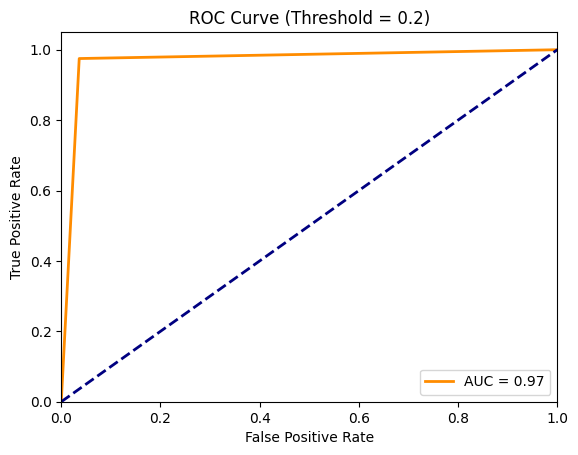

In [ ]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(actual_mask_1d, predicted_mask_1d1)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Threshold = {})'.format(threshold1))
plt.legend(loc="lower right")
plt.show()



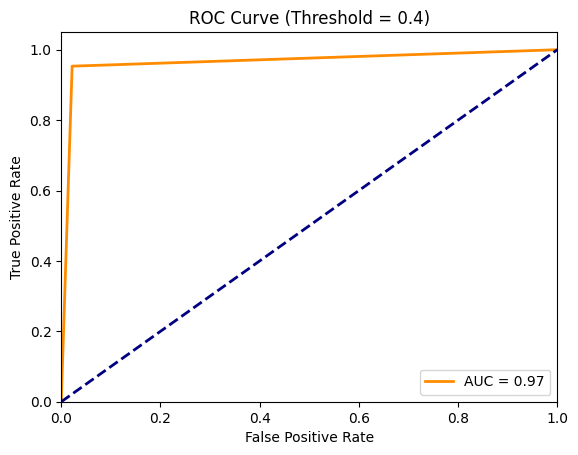

In [ ]:
fpr, tpr, thresholds = roc_curve(actual_mask_1d, predicted_mask_1d2)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Threshold = {})'.format(threshold2))
plt.legend(loc="lower right")
plt.show()

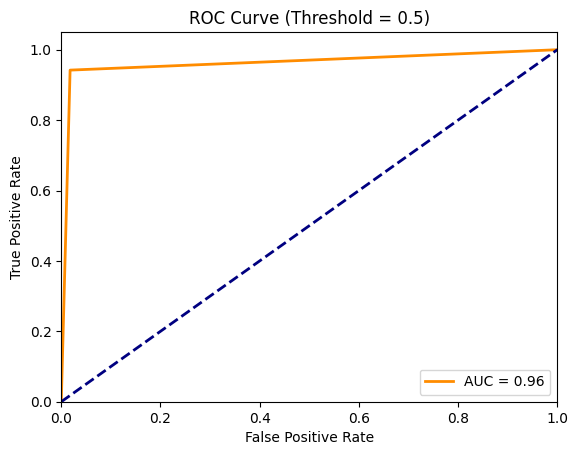

In [ ]:
fpr, tpr, thresholds = roc_curve(actual_mask_1d, predicted_mask_1d3)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Threshold = {})'.format(threshold3))
plt.legend(loc="lower right")
plt.show()

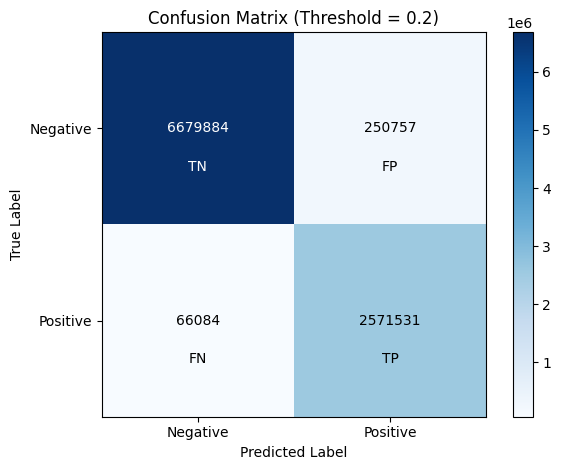

In [ ]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(actual_mask_1d, predicted_mask_1d1)

plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix (Threshold = {})'.format(threshold1))
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])

tp_color = 'black'
tn_color = 'white'
fp_color = 'black'
fn_color = 'black'

thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")
        if i == j:
            plt.text(j, i+0.2, 'TN' if i == 0 else 'TP',
                     ha="center", va="center", fontsize=10, color=tn_color if i == 0 else tp_color)
        else:
            plt.text(j, i+0.2, 'FN' if i > j else 'FP',
                     ha="center", va="center", fontsize=10, color=fn_color if i > j else fp_color)

plt.tight_layout()
plt.show()


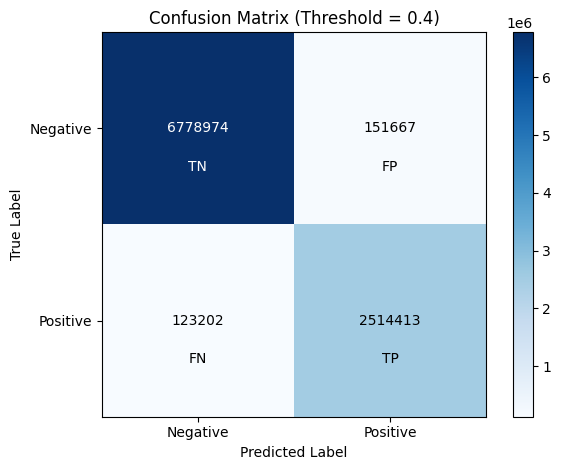

In [ ]:
conf_matrix = confusion_matrix(actual_mask_1d, predicted_mask_1d2)

plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix (Threshold = {})'.format(threshold2))
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])

thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")
        if i == j:
            plt.text(j, i+0.2, 'TN' if i == 0 else 'TP',
                     ha="center", va="center", fontsize=10, color=tn_color if i == 0 else tp_color)
        else:
            plt.text(j, i+0.2, 'FN' if i > j else 'FP',
                     ha="center", va="center", fontsize=10, color=fn_color if i > j else fp_color)

plt.tight_layout()
plt.show()

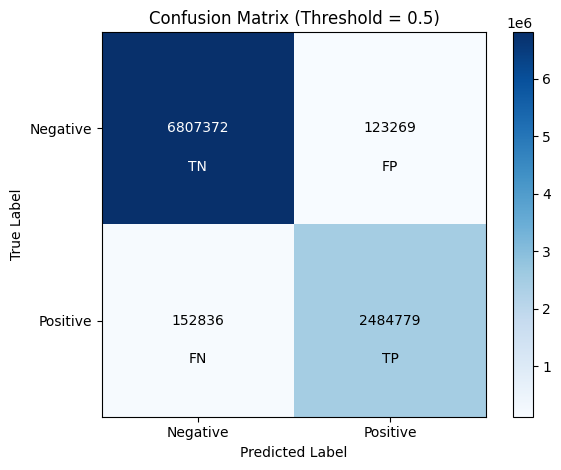

In [ ]:
conf_matrix = confusion_matrix(actual_mask_1d, predicted_mask_1d3)

plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix (Threshold = {})'.format(threshold3))
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")
        if i == j:
            plt.text(j, i+0.2, 'TN' if i == 0 else 'TP',
                     ha="center", va="center", fontsize=10, color=tn_color if i == 0 else tp_color)
        else:
            plt.text(j, i+0.2, 'FN' if i > j else 'FP',
                     ha="center", va="center", fontsize=10, color=fn_color if i > j else fp_color)

plt.tight_layout()
plt.show()

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model  
from google.colab import files  

model = load_model('/content/drive/MyDrive/Combination/part3_h5file.h5')

video_path = '/content/drive/MyDrive/Lane_Test/Swatt.mp4'
cap = cv2.VideoCapture(video_path)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

output_video_path = '/content/swatt_video0-6.mp4'
out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

threshold = 0.6

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    input_frame = cv2.resize(frame, (256, 256))  
    input_frame = input_frame / 255.0  
    input_frame = np.expand_dims(input_frame, axis=0)

    mask = model.predict(input_frame)[0]
    mask = (mask > threshold).astype(np.uint8) * 255  

    mask_resized = cv2.resize(mask, (frame_width, frame_height))

    overlay = cv2.addWeighted(frame, 0.8, cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2BGR), 0.2, 0)

    out.write(overlay)

cap.release()
out.release()
cv2.destroyAllWindows()

# Download the output video
files.download(output_video_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>